In [ ]:
# import library
import numpy as np
import colorcet
import bokeh.io
import bokeh.plotting
from scipy.integrate import odeint
import matplotlib.pyplot as plt
import bokeh.layouts
import bokeh.models

bokeh.io.output_notebook()

# **Chemical Equation for two miRNAs**

$$
[miR21_0] →^{k_{di21}} [miR21_1]→^{k_{de21}}\emptyset\\
[miR92_0] →^{k_{di92}} [miR92_1]→^{k_{de92}}\emptyset\\
[Gene] \rightarrow^{k_{tr}} [CLS]→^{k_{de\_CLS}}∅\\
[CLS]+[miR21_1]→^{k_{21\_CLS}}[OLS_1]→^{k_{de\_OLS_1}}∅\\
[OLS_1] + [miR92_1] →^{k_{OLS_{1}92}}[OLS_c]→^{k_{de\_OLS_c}}∅\\
[CLS] + [miR92_1]→^{k_{92\_CLS}}[OLS_2]→^{k_{de\_OLS_2}}∅\\
[OLS_2] + [miR21_1] →^{k_{OLS_{2}21}}[OLS_c]→^{k_{de\_OLS_c}}∅\\
[OLS_1]→^{k_{tl}}[aeB_{1}]→^{k_{de\_aeB}}∅\\
[OLS_2]→^{k_{tl}}[aeB_{2}]→^{k_{de\_aeB}}∅\\
[OLS_c ]→^{k_{tl}}[aeB_{c}]→^{k_{de\_aeB}}∅\\
$$

$$
\frac{d[miR21_0]}{dt}= -k_{di21}[miR21_0]
$$

$$
\frac{d[miR92_0]}{dt}= -k_{di92}[miR92_0]
$$

$$
\frac{d[miR21_1]}{dt}=k_{di21}[miR21_0]-k_{de21}[miR21_1]-k_{21\_CLS}[CLS][miR21_1] - k_{OLS_{2}21}[OLS_{2}][miR21_1]
$$

$$
\frac{d[miR92_1]}{dt}=k_{di92}[miR92_0]-k_{de92}[miR92_1]-k_{92\_CLS}[CLS][miR92_1] - k_{OLS_{1}92}[OLS_{1}][miR92_1]
$$

$$
\frac{d[CLS]}{dt}=k_{tr} - k_{de\_CLS}[CLS] - k_{21\_CLS}[CLS][miR21_1] - k_{92\_CLS}[CLS][miR92_1]
$$

$$
\frac{d[OLS_1]}{dt} = k_{21\_CLS}[CLS][miR21_1] - k_{OLS_{1}92}[OLS_{1}][miR92_1] - k_{de\_OLS_1}[OLS_{1}]
$$

$$
\frac{d[OLS_2]}{dt} = k_{92\_CLS}[CLS][miR92_1] - k_{OLS_{2}21}[OLS_{2}][miR21_1] - k_{de\_OLS_2}[OLS_{2}]
$$

$$
\frac{d[OLS_c]}{dt} = k_{OLS_{1}92}[OLS_{1}][miR92_1] + k_{OLS_{2}21}[OLS_{2}][miR21_1] - k_{de\_OLS_c}[OLS_{c}]
$$

$$
\frac{d[aeB_1]}{dt}= k_{tl}[OLS_1] - k_{de\_aeB}[aeB_1]
$$

$$
\frac{d[aeB_2]}{dt}= k_{tl}[OLS_2] - k_{de\_aeB}[aeB_2]
$$

$$
\frac{d[aeB_c]}{dt}= k_{tl}[OLS_c] - k_{de\_aeB}[aeB_c]
$$

$$
\frac{d[aeB_t]}{dt} = \frac{d[aeB_1]}{dt} + \frac{d[aeB_2]}{dt} + \frac{d[aeB_c]}{dt}
$$

**Minimal concentration for visible aeBlue chromoprotein = 3.86e-5 M or 0.0000386 M**

In [ ]:
import pandas as pd
# Create a DataFrame
def get_df(column_names, row_indexes):
  df = pd.DataFrame()

  for i in range(len(column_names)):
    df[column_names[i]] = row_indexes[i]

  return(df)

In [ ]:
# Setting Initial Conditions and Time Points
ts = 64800 # 18 hour
# miR210 = 5.e-4 # The value after the 3.86e-05 is: 1.535853224537712e-05. Assuming no fluctuation after passing the 3.86e-05, the AeB total last expressed visible in 40329 secs or 672.15 mins or 11.2025 hours
# miR920 = 5.e-4
# miR210 = 5.e-3 # The value after the 3.86e-05 is: 1.5079482561384443e-05. Assuming no fluctuation after passing the 3.86e-05, the AeB total last expressed visible in 49134 secs or 818.9 mins or 13.648333333333333 hours
# miR920 = 5.e-3
# miR210 = 5.e-2 # The value after the 3.86e-05 is: 1.4894463093044712e-05. Assuming no fluctuation after passing the 3.86e-05, the AeB total last expressed visible in 56949 secs or 949.15 mins or 15.819166666666666 hours
# miR920 = 5.e-2
# miR210 = 0.175 # The value after the 3.86e-05 is: 1.47259143736475e-05. Assuming no fluctuation after passing the 3.86e-05, the AeB total last expressed visible in 60652 secs or 1010.8666666666667 mins or 16.84777777777778 hours
# miR920 = 0.175
# miR210 = 1.2e-3 # Normal value. The value after the 3.86e-05 is: 1.5233509815566943e-05.Assuming no fluctuation after passing the 3.86e-05, the AeB total last expressed visible in 43730 secs or 728.8333333333334 mins or 12.147222222222222 hours
# miR920 = 1.2e-3
miR210 = 1.2e-2 #The value after the 3.86e-05 is: 1.5006618984043033e-05. Assuming no fluctuation after passing the 3.86e-05, the AeB total last expressed visible in 52296 secs or 871.6 mins or 14.526666666666667 hours
miR920 = 1.2e-2
y0 = [miR210, miR920, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]  # 0 miR21_1, 0 miR92_1, 0 CLS, 0 ols_1, 0 ols_2, 0 ols_c, 0 aeB_1, aeB_2, aeB_c, aeB_t
t = np.linspace(0, ts, num=ts)

In [ ]:
# Defining Parameters and ODE System
# miR21_1 fluctuation
k_di21 = 1.e-2
k_de21 = 3.e-4
k_21_CLS = 1.e5
#k_21_CLS = 1.e7

# miR92_1 fluctuation
k_di92 = 1.e-2
k_de92 = 3.e-4
k_92_CLS = 1.e5

# CLS fluctuation
k_tr = 0.000779
k_de_CLS = 3.e-4

# OLS-1 fluctuation
k_ols_1_92 = 1.e5
k_de_OLS_1 = 3.e-4

# parameters of OLS-2
k_ols_2_21 = 1.e5
k_de_OLS_2 = 3.e-4

# parameters of OLS-c
k_de_OLS_c = 3.e-4

# parameters of AeBlue fluctuation
k_tl = 0.0344
k_de_aeb = 0.00027

params = [k_di21, k_de21, k_21_CLS, k_di92, k_de92, k_92_CLS, k_tr, k_de_CLS,
          k_ols_1_92, k_de_OLS_1, k_ols_2_21, k_de_OLS_2, k_de_OLS_c, k_tl, k_de_aeb]

def sim(variables, t, params):
    # variables
    miR21_0 = variables[0]
    miR92_0 = variables[1]
    miR21_1 = variables[2]
    miR92_1 = variables[3]
    cls = variables[4]
    ols_1 = variables[5]
    ols_2 = variables[6]
    ols_c = variables[7]
    aeb_1 = variables[8]
    aeb_2 = variables[9]
    aeb_c = variables[10]

    # parameters of miR21 fluctuation
    k_di21 = params[0]
    k_de21 = params[1]
    k_21_CLS = params[2]

    # parameters of miR92 fluctuation
    k_di92 = params[3]
    k_de92 = params[4]
    k_92_CLS = params[5]

    # parameters of CLS fluctuation
    k_tr = params[6]
    k_de_CLS = params[7]

    # parameters of OLS-1
    k_ols_1_92 = params[8]
    k_de_OLS_1 = params[9]

    # parameters of OLS-2
    k_ols_2_21 = params[10]
    k_de_OLS_2 = params[11]

    # parameters of OLS-c
    k_de_OLS_c = params[12]

    # parameters of AeBlue fluctuation
    k_tl = params[13]
    k_de_aeb = params[14]

    # Equations

    dmiR21_0dt = -k_di21 * miR21_0
    dmiR92_0dt = -k_di92 * miR92_0
    dmiR21_1dt = k_di21 * miR21_0 - k_de21 * miR21_1 - k_21_CLS * cls * miR21_1 - k_ols_2_21 * ols_2 * miR21_1
    dmiR92_1dt = k_di92 * miR92_0 - k_de92 * miR92_1 - k_92_CLS * cls * miR92_1 - k_ols_1_92 * ols_1 * miR92_1
    dCLSdt = k_tr - k_de_CLS * cls - k_21_CLS * cls * miR21_1 - k_92_CLS * cls * miR92_1
    dOLS_1dt = k_21_CLS * cls * miR21_1 - k_ols_1_92 * ols_1 * miR92_1 - k_de_OLS_1 * ols_1
    dOLS_2dt = k_92_CLS * cls * miR92_1 - k_ols_2_21 * ols_2 * miR21_1 - k_de_OLS_2 * ols_2
    dOLS_cdt = k_ols_1_92 * ols_1 * miR92_1 + k_ols_2_21 * ols_2 * miR21_1 - k_de_OLS_c * ols_c
    daeb_1dt = k_tl * ols_1 - k_de_aeb * aeb_1
    daeb_2dt = k_tl * ols_2 - k_de_aeb * aeb_2
    daeb_cdt = k_tl * ols_c - k_de_aeb * aeb_c
    daeb_tdt = daeb_1dt + daeb_2dt + daeb_cdt

    #if t > 14400:
      #k_tr_modified = 0
      #dCLSdt = k_tr_modified - k_de_CLS * cls - k_21_CLS * cls * miR21_1 - k_92_CLS * cls * miR92_1

    return [dmiR21_0dt, dmiR92_0dt, dmiR21_1dt, dmiR92_1dt, dCLSdt, dOLS_1dt, dOLS_2dt, dOLS_cdt, daeb_1dt, daeb_2dt, daeb_cdt, daeb_tdt]

In [ ]:
# Solving the ODE System

y = odeint(sim, y0, t, args=(params,))

In [ ]:
y = np.append(y, np.full((ts, 1), 3.86e-5), axis=1)
print(y.shape)

(64800, 13)


In [ ]:
# Create a list of column names
column_names = ['miR21_0', 'miR92_0', 'miR21_1', 'miR92_1', 'CLS', 'ols_1', 'ols_2', 'ols_c', 'aeB_1', 'aeB_2', 'aeB_c', 'aeB_t', 'aeB_visible']

# Create a list of row indexes
row_indexes = [y[:,0], y[:,1], y[:,2], y[:,3], y[:,4], y[:,5], y[:,6], y[:,7], y[:,8], y[:,9], y[:,10], y[:,11], y[:,12]]
df = get_df(column_names, row_indexes)
df.head()

,miR21_0,miR92_0,miR21_1,miR92_1,CLS,ols_1,ols_2,ols_c,aeB_1,aeB_2,aeB_c,aeB_t,aeB_visible
0,0.012000,0.012000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000039
1,0.011881,0.011881,1.824962e-06,1.824962e-06,0.000572,0.000089,0.000089,0.000028,0.000001,0.000001,4.125594e-07,0.000003,0.000039
2,0.011762,0.011762,8.951860e-07,8.951860e-07,0.001144,0.000176,0.000176,0.000060,0.000006,0.000006,1.936470e-06,0.000014,0.000039
3,0.011645,0.011645,5.880623e-07,5.880623e-07,0.001720,0.000263,0.000263,0.000091,0.000014,0.000014,4.545103e-06,0.000032,0.000039
4,0.011529,0.011529,4.352689e-07,4.352689e-07,0.002297,0.000348,0.000348,0.000122,0.000024,0.000024,8.215630e-06,0.000056,0.000039


In [ ]:
# Set the threshold value
threshold_value = 3.86e-5
# peak =
# Filter the DataFrame to get values lower than the threshold
filtered_values = df[df['aeB_t'] < threshold_value]['aeB_t']

# Find the lowest value from the filtered values
if not filtered_values.empty:
    lower_threshold = max(filtered_values[df[df['aeB_t'] == df['aeB_t'].max()].index[0]:])
    print(f"The value after the {threshold_value} is: {lower_threshold}")
else:
    print(f"No values after the {threshold_value} found in the column.")
print(f"Assuming no fluctuation after passing the {threshold_value}, the AeB total last expressed visible in {df[df['aeB_t'] == lower_threshold].index[0]} secs or {df[df['aeB_t'] == lower_threshold].index[0]/60} mins or {df[df['aeB_t'] == lower_threshold].index[0]/3600} hours")

The value after the 3.86e-05 is: 1.5006618984043033e-05
Assuming no fluctuation after passing the 3.86e-05, the AeB total last expressed visible in 52296 secs or 871.6 mins or 14.526666666666667 hours


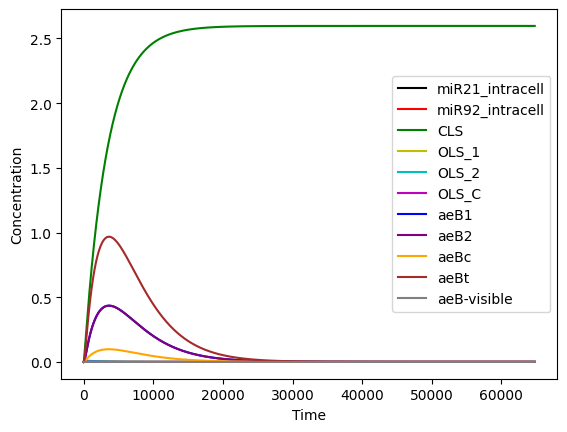

In [ ]:
# Plotting the Results using matplotlib

f, ax = plt.subplots(1)


line1, = ax.plot(t, y[:, 2], color="k", label="miR21_intracell")
line2, = ax.plot(t, y[:, 3], color="r", label="miR92_intracell")
line3, = ax.plot(t, y[:, 4], color="g", label="CLS")
line4, = ax.plot(t, y[:, 5], color="y", label="OLS_1")
line5, = ax.plot(t, y[:, 6], color="c", label="OLS_2")
line6, = ax.plot(t, y[:, 7], color="m", label="OLS_C")
line7, = ax.plot(t, y[:, 8], color="b", label="aeB1")
line8, = ax.plot(t, y[:, 9], color="purple", label="aeB2")
line9, = ax.plot(t, y[:, 10], color= "orange", label="aeBc")
line10, = ax.plot(t, y[:, 11], color= "brown", label="aeBt")
line11, = ax.plot(t, y[:, 12], color= "gray", label="aeB-visible")

ax.set_ylabel("Concentration")
ax.set_xlabel("Time")

ax.legend(handles=[
                   line1, #4
                   line2, #3
                   line3, #1
                   line4, #5
                   line5, #2
                   line6,
                   line7,
                   line8,
                   line9,
                   line10,
                   line11
                   ])

plt.show()

In [ ]:
y.shape

(64800, 13)

In [ ]:
df

,miR21_0,miR92_0,miR21_1,miR92_1,CLS,ols_1,ols_2,ols_c,aeB_1,aeB_2,aeB_c,aeB_t,aeB_visible
0,1.200000e-02,1.200000e-02,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000039
1,1.188060e-02,1.188060e-02,1.824962e-06,1.824962e-06,0.000572,8.933814e-05,8.933814e-05,2.822269e-05,1.480633e-06,1.480633e-06,4.125594e-07,3.373826e-06,0.000039
2,1.176238e-02,1.176238e-02,8.951860e-07,8.951860e-07,0.001144,1.764363e-04,1.764363e-04,6.021651e-05,6.055348e-06,6.055348e-06,1.936470e-06,1.404717e-05,0.000039
3,1.164534e-02,1.164534e-02,5.880623e-07,5.880623e-07,0.001720,2.625064e-04,2.625064e-04,9.140421e-05,1.360462e-05,1.360462e-05,4.545103e-06,3.175433e-05,0.000039
4,1.152947e-02,1.152947e-02,4.352689e-07,4.352689e-07,0.002297,3.478169e-04,3.478169e-04,1.219976e-04,2.409947e-05,2.409947e-05,8.215630e-06,5.641458e-05,0.000039
...,...,...,...,...,...,...,...,...,...,...,...,...,...
64795,-4.055045e-35,-4.055045e-35,-1.577813e-42,-1.577813e-42,2.596667,3.773662e-11,3.773662e-11,8.414850e-12,2.528620e-07,2.528620e-07,5.646821e-08,5.621923e-07,0.000039
64796,-4.047662e-35,-4.047662e-35,-1.574927e-42,-1.574927e-42,2.596667,3.772553e-11,3.772553e-11,8.412377e-12,2.527956e-07,2.527956e-07,5.645337e-08,5.620446e-07,0.000039
64797,-4.040266e-35,-4.040266e-35,-1.572037e-42,-1.572037e-42,2.596667,3.771444e-11,3.771444e-11,8.409905e-12,2.527292e-07,2.527292e-07,5.643854e-08,5.618969e-07,0.000039
64798,-4.032856e-35,-4.032856e-35,-1.569141e-42,-1.569141e-42,2.596667,3.770336e-11,3.770336e-11,8.407433e-12,2.526627e-07,2.526627e-07,5.642371e-08,5.617492e-07,0.000039


In [ ]:
# Plotting the Results using bokeh

# Set up color palette for this notebook
colors = colorcet.b_glasbey_category10

# Set up figure
p = bokeh.plotting.figure(
    frame_width=500,
    frame_height=400,
    x_axis_label="time (second)",
    y_axis_label="concentration (M)",
    x_range=[np.min(t), np.max(t)],
)

cds = bokeh.models.ColumnDataSource(
    dict(t=t, miR21_out=y[:, 0], miR92_out=y[:, 1], miR21_in=y[:, 2],
         miR92_in=y[:, 3], cls=y[:, 4], ols_1=y[:, 5],
         ols_2=y[:, 6], ols_c=y[:, 7], aeb1=y[:, 8], aeb2=y[:, 9], aebc=y[:, 10], aebt=y[:, 11], aebvis = y[:, 12])
)

# Populate glyphs
p.line(source=cds, x="t", y="miR21_out", line_width=3, color=colors[0], legend_label="miR21_0")
p.line(source=cds, x="t", y="miR92_out", line_width=3, color=colors[1], legend_label="miR92_0")
p.line(source=cds, x="t", y="miR21_in", line_width=3, color=colors[2], legend_label="miR21_1")
p.line(source=cds, x="t", y="miR92_in", line_width=3, color=colors[3], legend_label="miR92_1")
# p.line(source=cds, x="t", y="cls", line_width=3, color=colors[4], legend_label="CLS")
p.line(source=cds, x="t", y="ols_1", line_width=3, color=colors[5], legend_label="OLS_1")
p.line(source=cds, x="t", y="ols_2", line_width=3, color=colors[6], legend_label="OLS_2")
p.line(source=cds, x="t", y="ols_c", line_width=3, color=colors[7], legend_label="OLS_c")
p.line(source=cds, x="t", y="aeb1", line_width=3, color=colors[8], legend_label="aeB1")
p.line(source=cds, x="t", y="aeb2", line_width=3, color=colors[9], legend_label="aeB2")
p.line(source=cds, x="t", y="aebc", line_width=3, color=colors[10], legend_label="aeBc")
p.line(source=cds, x="t", y="aebt", line_width=3, color=colors[11], legend_label="aeBt")
p.line(source=cds, x="t", y="aebvis", line_width=3, color=colors[12], legend_label="aeB-visible")


# Aesthetic tweaks
p.legend.location = "center_right"
p.legend.click_policy = "hide"
# p.title.text = "ODE of LIRA Expression System with miR21_0 = 5.e-4 M; miR92a_0 = 5.e-4 M"
# p.title.text = "ODE of LIRA Expression System with miR21_0 = 5.e-3 M; miR92a_0 = 5.e-3 M"
# p.title.text = "ODE of LIRA Expression System with miR21_0 = 5.e-2 M; miR92a_0 = 5.e-2 M"
# p.title.text = "ODE of LIRA Expression System with miR21_0 = 1.2e-3 M; miR92a_0 = 1.2e-3 M"
p.title.text = "ODE of LIRA Expression System with miR21_0 = 1.2e-2 M; miR92a_0 = 1.2e-2 M"

bokeh.io.show(p)
# Minimal concentration for visible aeBlue chromoprotein = 3.86e-5 M or 0.0000386 M

# **Chemical Equation for one miRNA**

$$
[miR21_0] →^{k_{di21}} [miR21_1]→^{k_{de21}}\emptyset\\
[Gene] \rightarrow^{k_{tr}} [CLS]→^{k_{de\_CLS}}∅\\
[CLS]+[miR21_1]→^{k_{21\_CLS}}[OLS_1]→^{k_{de\_OLS_1}}∅\\
[OLS_1]→^{k_{tl}}[aeB_{1}]→^{k_{de\_aeB}}∅\\
$$

$$
\frac{d[miR21_0]}{dt}= -k_{di21}[miR21_0]
$$

$$
\frac{d[miR21_1]}{dt}=k_{di21}[miR21_0]-k_{de21}[miR21_1]-k_{21\_CLS}[CLS][miR21_1]
$$

$$
\frac{d[CLS]}{dt}=k_{tr} - k_{de\_CLS}[CLS] - k_{21\_CLS}[CLS][miR21_1]
$$

$$
\frac{d[OLS_1]}{dt} = k_{21\_CLS}[CLS][miR21_1] - k_{de\_OLS_1}[OLS_{1}]
$$

$$
\frac{d[aeB_1]}{dt}= k_{tl}[OLS_1] - k_{de\_aeB}[aeB_1]
$$

In [ ]:
import pandas as pd
# Create a DataFrame
def get_df(column_names, row_indexes):
  df = pd.DataFrame()

  for i in range(len(column_names)):
    df[column_names[i]] = row_indexes[i]

  return(df)

In [ ]:
# Setting Initial Conditions and Time Points
ts = 64800 # 18 hour
# miR210 = 5.e-4 # The value after the 3.86e-05 is: 1.5491934466303207e-05. Assuming no fluctuation after passing the 3.86e-05, the AeB total last expressed visible in 40255 secs or 670.9166666666666 mins or 11.181944444444444 hours
# miR920 = 5.e-4
# miR210 = 5.e-3 # The value after the 3.86e-05 is: 1.5259526771563812e-05. Assuming no fluctuation after passing the 3.86e-05, the AeB total last expressed visible in 49200 secs or 820.0 mins or 13.666666666666666 hours
# miR920 = 5.e-3
# miR210 = 5.e-2 #The value after the 3.86e-05 is: 1.500763443260668e-05. Assuming no fluctuation after passing the 3.86e-05, the AeB total last expressed visible in 58034 secs or 967.2333333333333 mins or 16.120555555555555 hours
# miR920 = 5.e-2
# miR210 = 0.175 # The value after the 3.86e-05 is: 1.4415746277648868e-05. Assuming no fluctuation after passing the 3.86e-05, the AeB total last expressed visible in 62911 secs or 1048.5166666666667 mins or 17.475277777777777 hours
# miR920 = 0.175

miR210 = 1.2e-3 # Normal value. The value after the 3.86e-05 is: 1.5387118966412456e-05. Assuming no fluctuation after passing the 3.86e-05, the AeB total last expressed visible in 50189 secs or 836.4833333333333 mins or 13.94138888888889 hours
# miR920 = 1.2e-3
# miR210 = 1.2e-2 #The value after the 3.86e-05 is: 1.5184579650555072e-05. Assuming no fluctuation after passing the 3.86e-05, the AeB total last expressed visible in 52565 secs or 876.0833333333334 mins or 14.60138888888889 hours
# miR920 = 1.2e-2

y0 = [miR210, miR920, 0, 0, 0]
t = np.linspace(0, ts, num=ts)

In [ ]:
# Defining Parameters and ODE System
# miR21_1 fluctuation
k_di21 = 1.e-2
k_de21 = 3.e-4
k_21_CLS = 1.e5

# miR92_1 fluctuation
# k_di92 = 1.e-2
# k_de92 = 3.e-4
# k_92_CLS = 1.e5

# CLS fluctuation
k_tr = 0.000779
k_de_CLS = 3.e-4

# OLS-1 fluctuation
# k_ols_1_92 = 1.e5
k_de_OLS_1 = 3.e-4

# parameters of OLS-2
# k_ols_2_21 = 1.e5
# k_de_OLS_2 = 3.e-4

# parameters of OLS-c
# k_de_OLS_c = 3.e-4

# parameters of AeBlue fluctuation
k_tl = 0.0344
k_de_aeb = 0.00027

params = [k_di21, k_de21, k_21_CLS, k_tr,
          k_de_CLS, k_de_OLS_1, k_tl, k_de_aeb]

def sim(variables, t, params):
    # variables
    miR21_0 = variables[0]
    # miR92_0 = variables[1]
    miR21_1 = variables[1]
    # miR92_1 = variables[3]
    cls = variables[2]
    ols_1 = variables[3]
    # ols_2 = variables[6]
    # ols_c = variables[7]
    aeb_1 = variables[4]
    # aeb_2 = variables[9]
    # aeb_c = variables[10]

    # parameters of miR21 fluctuation
    k_di21 = params[0]
    k_de21 = params[1]
    k_21_CLS = params[2]

    # parameters of miR92 fluctuation
    # k_di92 = params[3]
    # k_de92 = params[4]
    # k_92_CLS = params[5]

    # parameters of CLS fluctuation
    k_tr = params[3]
    k_de_CLS = params[4]

    # parameters of OLS-1
    # k_ols_1_92 = params[]
    k_de_OLS_1 = params[5]

    # parameters of OLS-2
    # k_ols_2_21 = params[10]
    # k_de_OLS_2 = params[11]

    # parameters of OLS-c
    # k_de_OLS_c = params[12]

    # parameters of AeBlue fluctuation
    k_tl = params[6]
    k_de_aeb = params[7]

    # Equations

    dmiR21_0dt = -k_di21 * miR21_0
    # dmiR92_0dt = -k_di92 * miR92_0
    dmiR21_1dt = k_di21 * miR21_0 - k_de21 * miR21_1 - k_21_CLS * cls * miR21_1
    # dmiR92_1dt = k_di92 * miR92_0 - k_de92 * miR92_1 - k_92_CLS * cls * miR92_1 - k_ols_1_92 * ols_1 * miR92_1
    dCLSdt = k_tr - k_de_CLS * cls - k_21_CLS * cls * miR21_1
    dOLS_1dt = k_21_CLS * cls * miR21_1 - k_de_OLS_1 * ols_1
    # dOLS_2dt = k_92_CLS * cls * miR92_1 - k_ols_2_21 * ols_2 * miR21_1 - k_de_OLS_2 * ols_2
    # dOLS_cdt = k_ols_1_92 * ols_1 * miR92_1 + k_ols_2_21 * ols_2 * miR21_1 - k_de_OLS_c * ols_c
    daeb_1dt = k_tl * ols_1 - k_de_aeb * aeb_1
    # daeb_2dt = k_tl * ols_2 - k_de_aeb * aeb_2
    # daeb_cdt = k_tl * ols_c - k_de_aeb * aeb_c
    # daeb_tdt = daeb_1dt + daeb_2dt + daeb_cdt

    #if t > 14400:
      #k_tr_modified = 0
      #dCLSdt = k_tr_modified - k_de_CLS * cls - k_21_CLS * cls * miR21_1 - k_92_CLS * cls * miR92_1

    return [dmiR21_0dt, dmiR21_1dt, dCLSdt, dOLS_1dt, daeb_1dt]

In [ ]:
# Solving the ODE System

y = odeint(sim, y0, t, args=(params,))

In [ ]:
y = np.append(y, np.full((ts, 1), 3.86e-5), axis=1)
print(y.shape)

(64800, 6)


In [ ]:
# Create a list of column names
column_names = ['miR21_0', 'miR21_1','CLS', 'ols_1', 'aeB_1', 'aeB_visible']

# Create a list of row indexes
row_indexes = [y[:,0], y[:,1], y[:,2], y[:,3], y[:,4], y[:,5]]
df = get_df(column_names, row_indexes)
df.head()

,miR21_0,miR21_1,CLS,ols_1,aeB_1,aeB_visible
0,0.001200,0.012000,0.000000e+00,0.000000,0.000000,0.000039
1,0.001188,0.011230,6.936213e-07,0.000778,0.000013,0.000039
2,0.001176,0.010460,7.447227e-07,0.001557,0.000054,0.000039
3,0.001165,0.009689,8.039163e-07,0.002335,0.000120,0.000039
4,0.001153,0.008919,8.732772e-07,0.003113,0.000214,0.000039


In [ ]:
# Set the threshold value
threshold_value = 3.86e-5
# peak =
# Filter the DataFrame to get values lower than the threshold
filtered_values = df[df['aeB_1'] < threshold_value]['aeB_1']

# Find the lowest value from the filtered values
if not filtered_values.empty:
    lower_threshold = max(filtered_values[df[df['aeB_1'] == df['aeB_1'].max()].index[0]:])
    print(f"The value after the {threshold_value} is: {lower_threshold}")
else:
    print(f"No values after the {threshold_value} found in the column.")
print(f"Assuming no fluctuation after passing the {threshold_value}, the AeB total last expressed visible in {df[df['aeB_1'] == lower_threshold].index[0]} secs or {df[df['aeB_1'] == lower_threshold].index[0]/60} mins or {df[df['aeB_1'] == lower_threshold].index[0]/3600} hours")

The value after the 3.86e-05 is: 1.5387118966412456e-05
Assuming no fluctuation after passing the 3.86e-05, the AeB total last expressed visible in 50189 secs or 836.4833333333333 mins or 13.94138888888889 hours


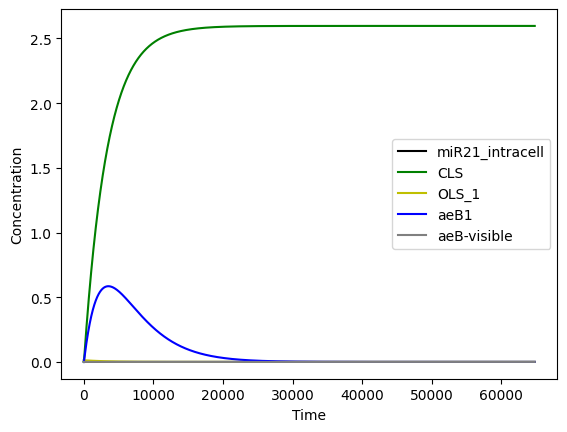

In [ ]:
# Plotting the Results using matplotlib

f, ax = plt.subplots(1)


line1, = ax.plot(t, y[:, 1], color="k", label="miR21_intracell")
# line2, = ax.plot(t, y[:, 3], color="r", label="miR92_intracell")
line2, = ax.plot(t, y[:, 2], color="g", label="CLS")
line3, = ax.plot(t, y[:, 3], color="y", label="OLS_1")
# line5, = ax.plot(t, y[:, 6], color="c", label="OLS_2")
# line6, = ax.plot(t, y[:, 7], color="m", label="OLS_C")
line4, = ax.plot(t, y[:, 4], color="b", label="aeB1")
# line8, = ax.plot(t, y[:, 9], color="purple", label="aeB2")
# line9, = ax.plot(t, y[:, 10], color= "orange", label="aeBc")
# line10, = ax.plot(t, y[:, 11], color= "brown", label="aeBt")
line5, = ax.plot(t, y[:, 5], color= "gray", label="aeB-visible")

ax.set_ylabel("Concentration")
ax.set_xlabel("Time")

ax.legend(handles=[
                   line1, #4
                   line2, #3
                   line3, #1
                   line4, #5
                   line5
                   ])

plt.show()

In [ ]:
y.shape

(64800, 6)

In [ ]:
df

,miR21_0,miR21_1,CLS,ols_1,aeB_1,aeB_visible
0,1.200000e-03,1.200000e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000039
1,1.188060e-03,1.123014e-02,6.936213e-07,7.782016e-04,1.337316e-05,0.000039
2,1.176238e-03,1.045974e-02,7.447227e-07,1.556812e-03,5.352757e-05,0.000039
3,1.164534e-03,9.689474e-03,8.039163e-07,2.335181e-03,1.204488e-04,0.000039
4,1.152947e-03,8.919328e-03,8.732772e-07,3.113306e-03,2.141206e-04,0.000039
...,...,...,...,...,...,...
64795,-4.465527e-26,-5.381963e-32,2.596667e+00,4.953888e-11,3.324455e-07,0.000039
64796,-4.473030e-26,-5.386739e-32,2.596667e+00,4.952486e-11,3.323592e-07,0.000039
64797,-4.480531e-26,-5.391510e-32,2.596667e+00,4.951084e-11,3.322729e-07,0.000039
64798,-4.488030e-26,-5.396277e-32,2.596667e+00,4.949683e-11,3.321867e-07,0.000039


In [ ]:
# Plotting the Results using bokeh

# Set up color palette for this notebook
colors = colorcet.b_glasbey_category10

# Set up figure
p = bokeh.plotting.figure(
    frame_width=500,
    frame_height=400,
    x_axis_label="time (second)",
    y_axis_label="concentration (M)",
    x_range=[np.min(t), np.max(t)],
)

cds = bokeh.models.ColumnDataSource(
    dict(t=t, miR21_out=y[:, 0], miR21_in=y[:, 1], cls=y[:, 2],
         ols_1=y[:, 3], aeb1=y[:, 4], aebvis = y[:, 5])
)

# Populate glyphs
p.line(source=cds, x="t", y="miR21_out", line_width=3, color=colors[0], legend_label="miR21_0")
# p.line(source=cds, x="t", y="miR92_out", line_width=3, color=colors[1], legend_label="miR92_0")
p.line(source=cds, x="t", y="miR21_in", line_width=3, color=colors[2], legend_label="miR21_1")
# p.line(source=cds, x="t", y="miR92_in", line_width=3, color=colors[3], legend_label="miR92_1")
p.line(source=cds, x="t", y="cls", line_width=3, color=colors[4], legend_label="CLS")
p.line(source=cds, x="t", y="ols_1", line_width=3, color=colors[5], legend_label="OLS_1")
# p.line(source=cds, x="t", y="ols_2", line_width=3, color=colors[6], legend_label="OLS_2")
# p.line(source=cds, x="t", y="ols_c", line_width=3, color=colors[7], legend_label="OLS_c")
p.line(source=cds, x="t", y="aeb1", line_width=3, color=colors[8], legend_label="aeB1")
# p.line(source=cds, x="t", y="aeb2", line_width=3, color=colors[9], legend_label="aeB2")
# p.line(source=cds, x="t", y="aebc", line_width=3, color=colors[10], legend_label="aeBc")
# p.line(source=cds, x="t", y="aebt", line_width=3, color=colors[11], legend_label="aeBt")
p.line(source=cds, x="t", y="aebvis", line_width=3, color=colors[12], legend_label="aeB-visible")


# Aesthetic tweaks
p.legend.location = "center_right"
p.legend.click_policy = "hide"
# p.title.text = "ODE of LIRA Expression System with miR21_0 = 5.e-4 M (one miRNA)"
# p.title.text = "ODE of LIRA Expression System with miR21_0 = 5.e-3 M (one miRNA)"
# p.title.text = "ODE of LIRA Expression System with miR21_0 = 5.e-2 M (one miRNA)"
# p.title.text = "ODE of LIRA Expression System with miR21_0 = 0.175 M"

# p.title.text = "ODE of LIRA Expression System with miR21_0 = 1.2e-2 M (one miRNA)"
p.title.text = "ODE of LIRA Expression System with miR21_0 = 1.2e-3 M (one miRNA)"

bokeh.io.show(p)
# Minimal concentration for visible aeBlue chromoprotein = 3.86e-5 M or 0.0000386 M